In [1]:
import os

if not os.path.exists(".gitignore"):
    notebook_dir = os.path.join(os.path.abspath(""), "..", "..")

    # Change the CWD to the notebook's directory
    %cd $notebook_dir

d:\CrystalVision


In [2]:
import pandas as pd
from keras.utils.image_dataset import paths_and_labels_to_dataset
from sklearn.model_selection import train_test_split

from crystalvision.data.base import DATA_DIR
from crystalvision.data import dataset


df = dataset.imagine_database()

# Ignore by language
# df = df.query(f"~filename.str.contains('_eg')")  # English
df = df.query(f"~filename.str.contains('_fr')")  # French
df = df.query(f"~filename.str.contains('_es')")  # Spanish
df = df.query(f"~filename.str.contains('_it')")  # Italian
df = df.query(f"~filename.str.contains('_de')")  # German
df = df.query(f"~filename.str.contains('_jp')")  # Japanese

df.drop(["images"], axis=1, inplace=True)
for lang in ("_es", "_de", "_fr", "_it"):
    df = df.loc[:,~df.columns.str.endswith(lang)]
# df.sort_values('code', ascending=False, inplace=True)

codes, uniques = df["mono"].factorize()
X_train, X_test, y_train, y_test = train_test_split(df['filename'],
                                                    codes,
                                                    test_size=0.33,
                                                    random_state=23,
                                                    shuffle=True,
                                                    stratify=df[["mono", "type_en"]])

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

# df

In [3]:
import importlib

importlib.reload(dataset)

orig_ds = paths_and_labels_to_dataset(
    image_paths=X_train.tolist(),
    image_size=(250, 179),
    num_channels=3,
    labels=y_train.tolist(),
    label_mode="binary",
    num_classes=len(uniques),
    interpolation="bilinear",
    # crop_to_aspect_ratio=crop_to_aspect_ratio,
)

ds = dataset.extendDataset(orig_ds, seed=23, shuffle=False)
print(ds.cardinality())

tf.Tensor(121, shape=(), dtype=int64)


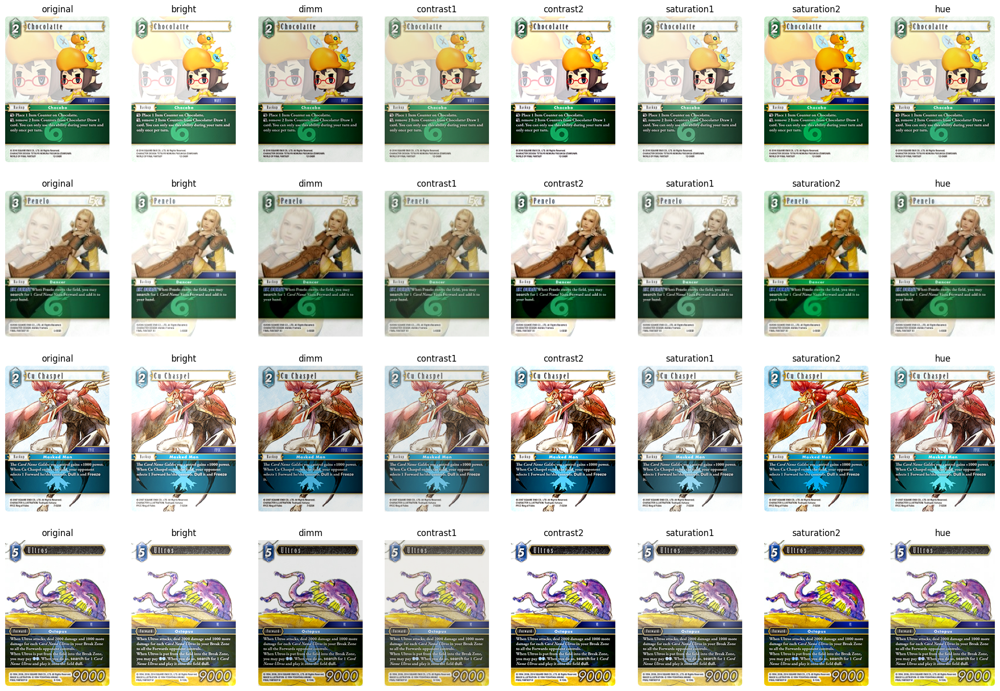

In [4]:
%matplotlib inline

import tensorflow as tf
from matplotlib import pyplot as plt

fig = plt.figure(figsize=(25, 17))

for j, (img, _) in enumerate(orig_ds.skip(128).take(4)):
    img /= 255.

    imgs = {
        "original": img,
        "bright": tf.clip_by_value(tf.image.adjust_brightness(img, 0.1), 0, 1.0),
        "dimm": tf.clip_by_value(tf.image.adjust_brightness(img, -0.1), 0, 1.0),
        "contrast1": tf.clip_by_value(tf.image.adjust_contrast(img, 0.80), 0, 1.0),
        "contrast2": tf.clip_by_value(tf.image.adjust_contrast(img, 1.25), 0, 1.0),
        "saturation1": tf.clip_by_value(tf.image.adjust_saturation(img, 0.65), 0, 1.0),
        "saturation2": tf.clip_by_value(tf.image.adjust_saturation(img, 1.75), 0, 1.0),
        "hue": tf.clip_by_value(tf.image.random_hue(img, 0.035), 0, 1.0),
    }

    for i, (title, img) in enumerate(imgs.items()):
        fig.add_subplot(4, len(imgs), 1 + i + (j * len(imgs)))
        plt.axis('off')
        plt.imshow(img)
        plt.title(title)

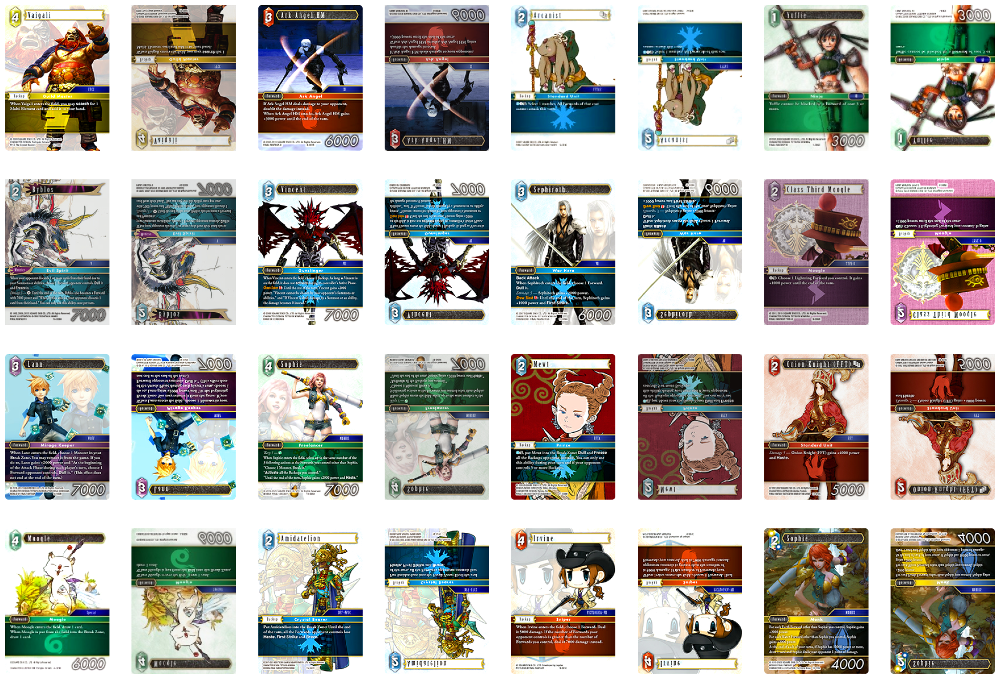

In [5]:
fig = plt.figure(figsize=(25, 17))

for images, labels in ds.take(1):
    for i, img in enumerate(images):
        fig.add_subplot(4, 8, i + 1)
        plt.imshow(img)
        plt.axis('off')
        # plt.title("Second")
    break

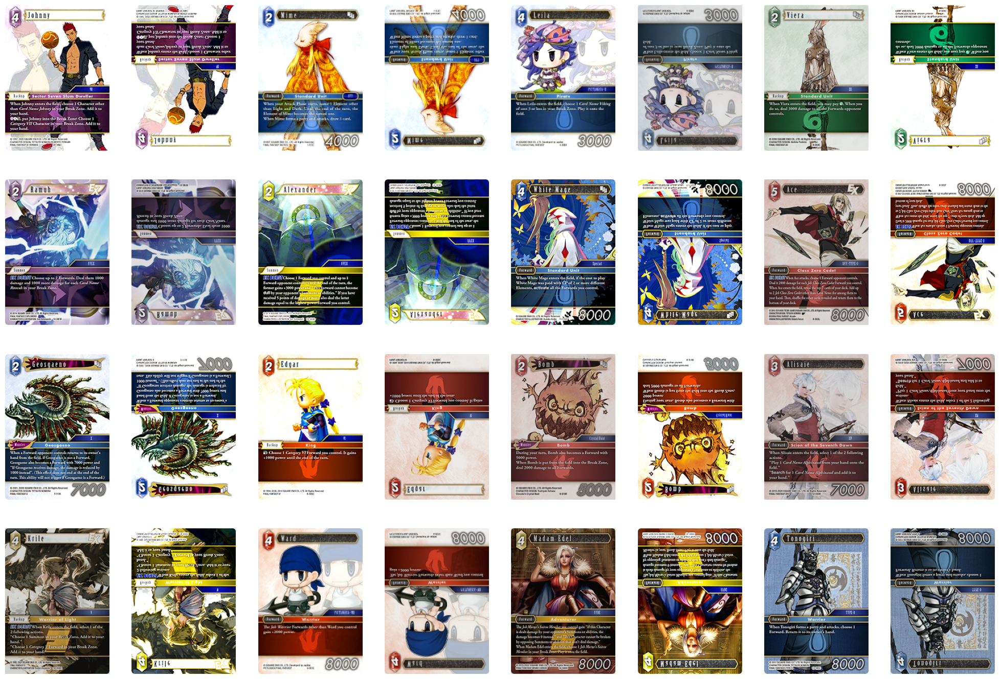

In [6]:
fig = plt.figure(figsize=(25, 17))

for images, labels in ds.skip(ds.cardinality() - 2).take(1):
    for i, img in enumerate(images):
        fig.add_subplot(4, 8, i + 1)
        plt.imshow(img)
        plt.axis('off')
        # plt.title("Second")
    break